# Denoise with NGMeet

In [300]:
import sys, os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from EDX import *
from utils import *
from VCA import *
from utils_sofima import *
import torch
from torch.utils.data import DataLoader
from utils_noise import *
from bm3d import bm3d, BM3DStages
from bm4d import bm4d, BM4DStages
import pickle
import copy
import time
import humanfriendly
from skimage.restoration import estimate_sigma
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import random
import humanfriendly
from torchmetrics.image import SpectralAngleMapper
import pacmap
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from skimage.metrics import structural_similarity as ssim
import gc
import psutil
from multiprocessing import Pool
from scipy.optimize import nnls
from itertools import repeat

device = torch.device("mps")
print(device)

%load_ext autoreload
%autoreload 2

mps
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Load aligned tile (to be denoised)

In [239]:
with open('../preprocessing_basic/results/preprocessed_edx/20251201_142554_tile_aligned_20frames.pkl', 'rb') as file:
    tile = pickle.load(file)

tile.apply("crop", parameters = {"crop_idx": (slice(50,tile.EDX_dim[0]-50),slice(50,tile.EDX_dim[1]-50),slice(None,None,None))})
tile.apply("binning", parameters={"dim": (974,974,250)})
tile.apply("MeanFilterEDX", parameters={"kernel_size": 3})

#h, w, b = tile.EDX_dim
tile.summary()

,operation,parameters,haadf size,EDX size,notes
0,crop,"crop_idx=(slice(None, None, None), slice(None,...","(2048, 2048)","(2048, 2048, 4000)",None
1,binning,"dim=(2048, 2048, 250)","(2048, 2048)","(2048, 2048, 250)",None
2,sofima_align,"hsi_stack_loc_path=tmp/unaligned_hsi, alignmen...","(2048, 2048)","(2048, 2048, 250)",None
3,crop,"crop_idx=(slice(50, 1998, None), slice(50, 199...","(1948, 1948)","(1948, 1948, 250)",None
4,binning,"dim=(974, 974, 250)","(974, 974)","(974, 974, 250)",None
5,MeanFilterEDX,kernel_size=3,"(974, 974)","(974, 974, 250)",None


### (optional) Load non-aligned tile

In [240]:
# load data
#file_path = "../data/EMD/EDXdataset.emd"
#EDX, haadf, xray_energies = load_EDX(file_path, first_frame=0, last_frame=100,sum_frames=True)
#tile = EM_EDX(haadf, EDX, xray_energies)
#tile.apply("crop", parameters={"crop_idx": (slice(None), slice(None), slice(96, 4096))})
##tile.apply("binning", parameters={"dim": (1024, 1024, 500)})
#tile.apply("MeanFilterEDX", parameters={"kernel_size": 3})


### Load refrence tile

In [4]:
with open('../preprocessing_basic/results/preprocessed_edx/20260114_062341_tile_aligned_100frames_align2zero.pkl', 'rb') as file:
    tile_ref = pickle.load(file)

tile_ref.apply("crop", parameters = {"crop_idx": (slice(50,tile_ref.EDX_dim[0]-50),slice(50,tile_ref.EDX_dim[1]-50),slice(None,None,None))})
tile_ref.apply("binning", parameters={"dim": (int(tile_ref.EDX_dim[0]/2),int(tile_ref.EDX_dim[1]/2),250)})
tile_ref.apply("MeanFilterEDX", parameters={"kernel_size": 3})

#h, w, b = tile.EDX_dim
tile_ref.summary()

,operation,parameters,haadf size,EDX size,notes
0,crop,"crop_idx=(slice(None, None, None), slice(None,...","(2048, 2048)","(2048, 2048, 4000)",None
1,binning,"dim=(2048, 2048, 250)","(2048, 2048)","(2048, 2048, 250)",None
2,sofima_align,"hsi_stack_path=tmp/unaligned_hsi_100frames, al...","(2048, 2048)","(2048, 2048, 250)",None
3,crop,"crop_idx=(slice(50, 1998, None), slice(50, 199...","(1948, 1948)","(1948, 1948, 250)",None
4,binning,"dim=(974, 974, 250)","(974, 974)","(974, 974, 250)",None
5,MeanFilterEDX,kernel_size=3,"(974, 974)","(974, 974, 250)",None


### Optional: additional cropping

In [ ]:
#tile.apply("crop", parameters = {"crop_idx": (slice(600,900),slice(600,900),slice(None,None,None))})
#tile_ref.apply("crop", parameters = {"crop_idx": (slice(600,900),slice(600,900),slice(None,None,None))})

### NGMeet in matlab

In [241]:
# Start matlab engine and set path
eng = matlab.engine.start_matlab()
matlab_path = eng.genpath('../matlab/')   # add path recursively
eng.addpath(matlab_path, nargout=0)

### NGMeet parameters

In [242]:
# set dataset to denoise
hsi_noisy = np.ascontiguousarray(tile.EDX)
hsi_noisy, min, max = MinMax(hsi_noisy, return_extra=True)
h,w,b = hsi_noisy.shape


# Optional variance stablilzation
G = np.mean(hsi_noisy,axis=2).reshape(h*w,1)
#G = np.ones_like(G)   # optional
H = np.mean(np.mean(hsi_noisy,axis=0),axis=0).reshape(b,-1)
W = G@np.transpose(H)
W = np.sqrt(W)    
hsi_noisy = np.divide(hsi_noisy,W.reshape((h,w,b)))


# Estimate noise
noise_est, noise_corr = est_noise(hsi_noisy.reshape(tile.EDX_2D.shape), 'additive_noise')

### HySime to estimate k

In [243]:
k, _ = hysime(hsi_noisy.reshape(tile.EDX_2D.shape), noise_est, noise_corr)
print(k)
sigma  = np.sqrt(np.var(noise_est))

3


### Default value for sigma in the 
- 0.1 times the standard deviation of a channel in the middle.

In [244]:
middel_channel = int(np.ceil(tile.EDX_dim[2]/2))
print("Middle channel: ", middel_channel)
print("Before VTS: ", 0.1*np.std(tile.EDX[:,:,middel_channel]))
print("After VST: ", 0.1*np.std(hsi_noisy[:,:,middel_channel]))
print("Estimate (psp): ", sigma)
print("Skimage estimate: ", estimate_sigma(hsi_noisy))

Middle channel:  125
Before VTS:  0.0002237163
After VST:  0.01440782
Estimate (psp):  0.149699677544732
Skimage estimate:  0.03205633952229712


### Denoising

In [245]:
start = time.perf_counter()

hsi_clean =  eng.denoiseNGMeet(
    hsi_noisy,     
    'Sigma', 0.3,   #sigma,
    'SpectralSubspace', 10,
    'NumIterations', 2,
    nargout=1
)
hsi_clean =  np.asarray(hsi_clean)


# optional undo variance scaling (and minmaxing)
hsi_clean = np.multiply(hsi_clean, W.reshape((h,w,b)))
hsi_clean = MinMaxInverse(hsi_clean, min, max)



# Assign to new tile object
tile_NGMeet = tile.apply("crop", parameters={"crop_idx": (slice(None), slice(None), slice(None))},copy_instance=True)
tile_NGMeet.EDX = hsi_clean


# time
elapsed = time.perf_counter() - start
print("Elapsed time for denoising:", humanfriendly.format_timespan(elapsed))

Elapsed time for denoising: 4 minutes and 41.65 seconds


In [246]:
print("This is a sanity check:")
print("tile is the same as tile_ref: ", np.array_equal(tile.EDX,tile_ref.EDX))
print("tile is the same as tile_NGMeet: ",np.array_equal(tile.EDX,tile_NGMeet.EDX))
print("tile_NGMeet is the same as tile_ref: ",np.array_equal(tile_NGMeet.EDX,tile_ref.EDX))

This is a sanity check:
tile is the same as tile_ref:  False
tile is the same as tile_NGMeet:  False
tile_NGMeet is the same as tile_ref:  False


### Visual comparison

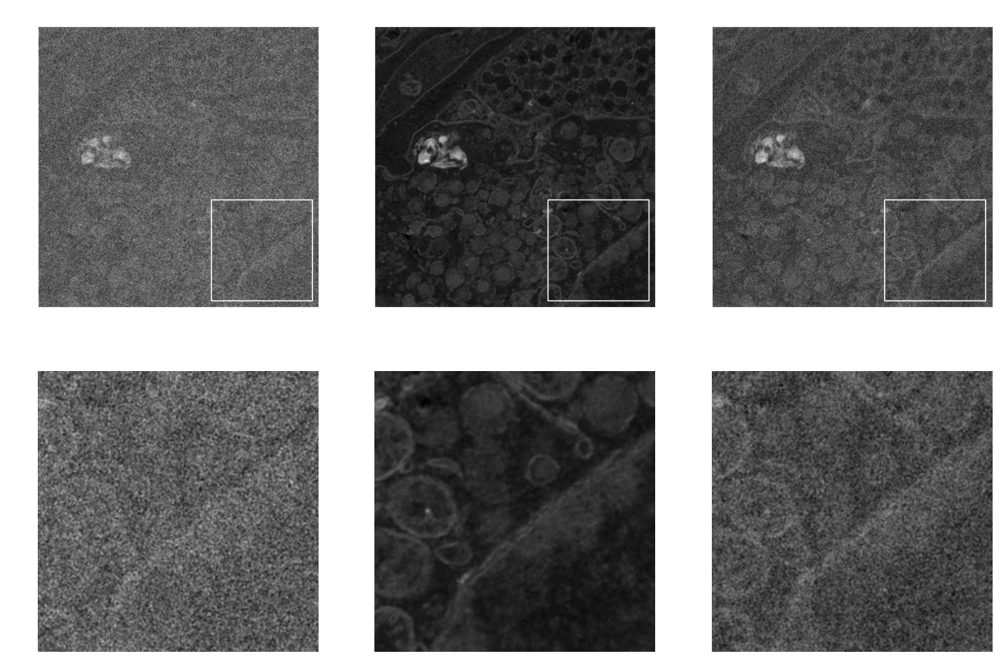

In [260]:
# compare
corr = 0


#bands = [25-corr,25-corr,25-corr]
#bands = [28-corr,28-corr,28-corr]
#bands = [4-corr,4-corr,4-corr]
#bands = [24-corr,24-corr,24-corr]
bands = [9-corr,9-corr,9-corr]


#bands = [4-corr,25-corr,28-corr]


#zoom = (slice(400,600),slice(150,350),slice(None))
zoom = (slice(600,950),slice(600,950),slice(None))
#zoom = (slice(500,700),slice(650,850),slice(None))
#zoom = (slice(None,None),slice(None,None),slice(None))
#zoom = (slice(1250,1750),slice(1250,1750),slice(None))
#zoom = (slice(250,450),slice(150,350),slice(None))

f, ax = plt.subplots(2,3,figsize=(15,10))
ax[0][0].imshow(tile.FalseColor(bands))
ax[0][0].set_title('Raw')
ax[0][1].imshow(tile_NGMeet.FalseColor(bands))
ax[0][1].set_title('Denoised')
ax[0][2].imshow(tile_ref.FalseColor(bands))
ax[0][2].set_title('Ref (100 aligned)')

ax[1][0].imshow(tile.FalseColor(bands)[zoom])
ax[1][1].imshow(tile_NGMeet.FalseColor(bands)[zoom])
ax[1][2].imshow(tile_ref.FalseColor(bands)[zoom])


# Extract rectangle from zoom slices
ys, xs, _ = zoom
y0 = ys.start or 0
y1 = ys.stop or metric_noisy.shape[0]
x0 = xs.start or 0
x1 = xs.stop or metric_noisy.shape[1]



ax[0][0].add_patch(patches.Rectangle((x0, y0), x1 - x0, y1 - y0,
                      linewidth=1, edgecolor='white', facecolor='none'))
ax[0][1].add_patch(
    patches.Rectangle((x0, y0), x1 - x0, y1 - y0,
                      linewidth=1, edgecolor='white', facecolor='none'))

ax[0][2].add_patch(
    patches.Rectangle((x0, y0), x1 - x0, y1 - y0,
                      linewidth=1, edgecolor='white', facecolor='none'))


ax[1][0].axis('off')
ax[1][1].axis('off')
ax[1][2].axis('off')


make_dark_presentation(f,text_color='white', line_width=2.5, transparent=True)
plt.savefig("/Users/aj/Desktop/WIPfigures/figure_denoising_visual_Osmium.png", dpi=300, transparent=True)

### PSNR and SSIM comparison

In [261]:
psrn_noisy_ref = eval_psnr(tile.EDX.astype('float32'), tile_ref.EDX.astype('float32'))
psnr_denoised_ref = eval_psnr(tile_NGMeet.EDX.astype('float32'), tile_ref.EDX.astype('float32'))

In [262]:
print(np.mean(psrn_noisy_ref), np.mean(psnr_denoised_ref))

19.311615576971636 18.466157051700517


In [99]:
ssim_noisy_ref = eval_ssim3(tile.EDX.astype('float32'), tile_ref.EDX.astype('float32'))
ssim_denoised_ref = eval_ssim3(tile_NGMeet.EDX.astype('float32'), tile_ref.EDX.astype('float32'))

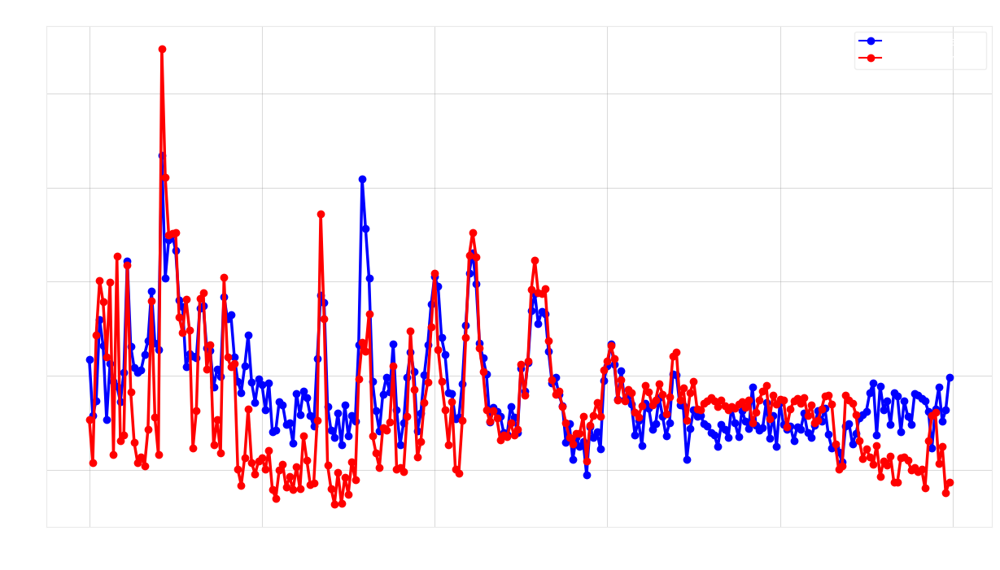

In [267]:
f, ax = plt.subplots(figsize=(15,8))

ax.plot(psrn_noisy_ref[:], 'o-b')
ax.plot(psnr_denoised_ref[:],'o-r')
ax.set_title('PSNR per channel compared to the 100 frame reference')
ax.legend(['Noisy vs. ref', 'Denoised vs. ref'])
ax.set_ylabel('PSNR (dB)')
ax.set_xlabel('Hyperspectral band number')
ax.grid('True')

make_dark_presentation(f,text_color='white', line_width=2.5, transparent=True)
plt.savefig("/Users/aj/Desktop/WIPfigures/PSNR.png", dpi=300, transparent=True)

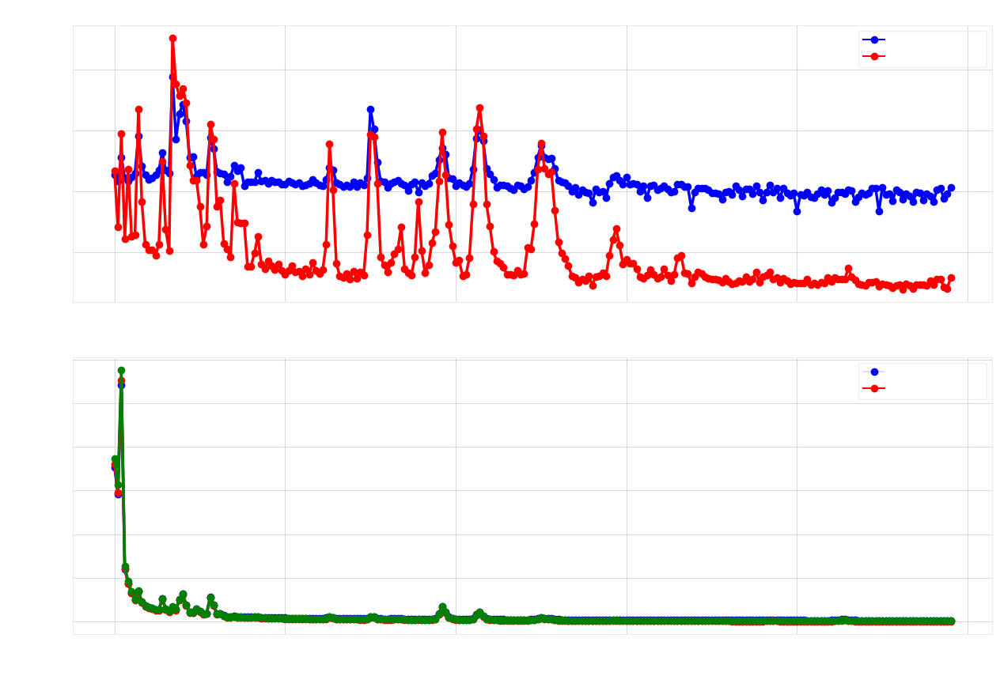

In [279]:
f, ax = plt.subplots(2,1,figsize=(15,10))

ax[0].plot(ssim_noisy_ref[4:], 'o-b')
ax[0].plot(ssim_denoised_ref[4:],'o-r')
ax[0].set_title('SSIM per channel compared to the 100 frame reference')
ax[0].legend(['Noisy vs. ref', 'Denoised vs. ref'])
ax[0].set_ylabel('SSIM')
ax[0].set_xlabel('Hyperspectral band number')
ax[0].grid('True')

ax[1].plot(MinMax(tile.EDX[:,:,4:]).sum(axis=(0,1)), 'o-b',linewidth=0.2)
ax[1].plot(MinMax(tile_NGMeet.EDX[:,:,4:]).sum(axis=(0,1)), 'o-r')
ax[1].plot(MinMax(tile_ref.EDX[:,:,4:]).sum(axis=(0,1)), 'o-g')
ax[1].set_title('SSIM per channel compared to the 100 frame reference')
ax[1].legend(['Noisy vs. ref', 'Denoised vs. ref'])
ax[1].set_ylabel('SSIM')
ax[1].set_xlabel('Hyperspectral band number')
ax[1].grid('True')


make_dark_presentation(f,text_color='white', line_width=2.5, transparent=True)
plt.savefig("/Users/aj/Desktop/SSIM.png", dpi=300, transparent=True)

### Spectral Angle Mapper

In [106]:
SAM_torch = SpectralAngleMapper(reduction='none')
t1 = torch.from_numpy(MinMax(tile.EDX).transpose(2,0,1)).unsqueeze(0)
t2 = torch.from_numpy(MinMax(tile_ref.EDX).transpose(2,0,1)).unsqueeze(0)

metric_noisy = SAM_torch(t1,t2).squeeze().numpy()

t1 = torch.from_numpy(MinMax(tile_NGMeet.EDX).transpose(2,0,1)).unsqueeze(0)
t2 = torch.from_numpy(MinMax(tile_ref.EDX).transpose(2,0,1)).unsqueeze(0)
metric_denoised = SAM_torch(t1,t2).squeeze().numpy()




/Users/aj/Desktop/work/virtualenvs/edx_new/lib/python3.11/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `SpectralAngleMapper` will save all targets and predictions in the buffer when using`reduction=None` or `reduction='none'. For large datasets, this may lead to a large memory footprint.
  warnings.warn(*args, **kwargs)


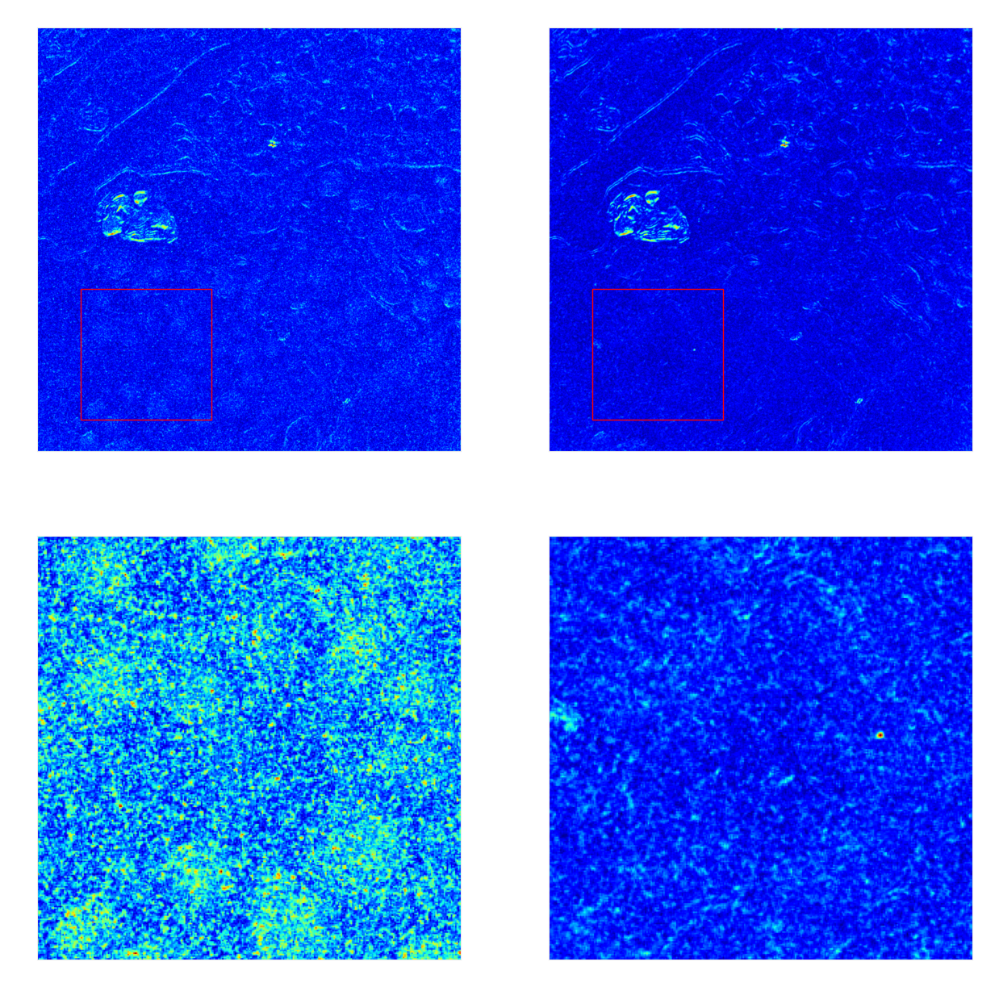

In [230]:
import matplotlib.patches as patches
zoom = (slice(600,900),slice(100,400))

f, ax = plt.subplots(2,2,figsize=(15,15))
ax[0][0].imshow(metric_noisy,cmap='jet')
ax[0][0].set_title(f"SAM noisy vs. reference (Avg={metric_noisy.mean():.4f} rad)",fontsize=16)
ax[0][1].imshow(metric_denoised,cmap='jet')
ax[0][1].set_title(f"Avg. SAM denoised vs. reference (Avg={metric_denoised.mean():.4f} rad)",fontsize=16)
ax[1][0].imshow(metric_noisy[zoom],cmap='jet')
ax[1][1].imshow(metric_denoised[zoom],cmap='jet')


# Extract rectangle from zoom slices
ys, xs = zoom
y0 = ys.start or 0
y1 = ys.stop or metric_noisy.shape[0]
x0 = xs.start or 0
x1 = xs.stop or metric_noisy.shape[1]



ax[0][0].add_patch(patches.Rectangle((x0, y0), x1 - x0, y1 - y0,
                      linewidth=1, edgecolor='red', facecolor='none'))
ax[0][1].add_patch(
    patches.Rectangle((x0, y0), x1 - x0, y1 - y0,
                      linewidth=1, edgecolor='red', facecolor='none'))



make_dark_presentation(f,text_color='white', line_width=2.5, transparent=True)
plt.savefig("/Users/aj/Desktop/spectralanglemapper.png", dpi=300, transparent=True)



### PACMAP

In [116]:
tiles_binned = [tile,tile_NGMeet,tile_ref]

n_samples = tiles_binned[0].EDX.shape[0]**2

# subsample
subsample_ratio = 0.3
nTrain = int(subsample_ratio*n_samples)   # number of training samples
multi_scale = False
poisson = False

# random seed
random.seed(100)
sample_idx = np.random.choice(n_samples,nTrain,replace=False)  

all_embeddings = []

for tile_tmp in tiles_binned:

    start = time.perf_counter()
    
    # PaCMAP
    reduction_model = pacmap.PaCMAP(n_components=2, n_neighbors=None, save_tree=True)

    # select the training dataset (w/o any scaling/normalizations)
    hsi_train = tile_tmp.EDX

    # get dimensions
    h, w, b = tile_tmp.EDX_dim
    
    # options (in this order)
    if poisson:       
        # Optional variance stablilzation
        G = np.mean(tile_tmp.EDX,axis=2).reshape(h*w,1)
        H = np.mean(np.mean(tile_tmp.EDX,axis=0),axis=0).reshape(b,-1)
        W = G@np.transpose(H)
        W = np.sqrt(W)    
        hsi_train = np.divide(tile_tmp.EDX,W.reshape((h,w,b)))
    
    if multi_scale:
        hsi_train = hsi_multi_scale(hsi_train,radii=[1,3,5],sigma=2)

    # fitting
    hsi_train = hsi_train.reshape((h*w,hsi_train.shape[2]))  
    reduction_model.fit(hsi_train[sample_idx,:])
    embeddings = reduction_model.embedding_
    
    # scaling (scale both reduced dimensions to 0-1)
    scaler = MinMaxScaler()
    embeddings = scaler.fit_transform(embeddings)

    # append to list
    all_embeddings.append(embeddings)

    # time
    elapsed = time.perf_counter() - start
    print(f"Elapsed time for finding pacmap embeddings: {humanfriendly.format_timespan(elapsed):s}")

Elapsed time for finding pacmap embeddings: 2 minutes and 41.96 seconds
Elapsed time for finding pacmap embeddings: 2 minutes and 38.26 seconds
Elapsed time for finding pacmap embeddings: 2 minutes and 41.88 seconds


In [119]:
print(np.array_equal(tile.EDX,tile_ref.EDX))
print(np.array_equal(tile.EDX,tile_NGMeet.EDX))
print(np.array_equal(tile_NGMeet.EDX,tile_ref.EDX))

False
False
False


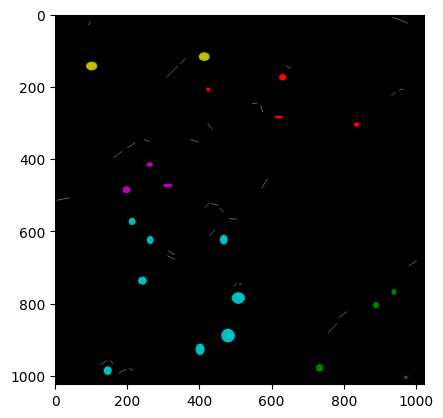

In [323]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# Get masks
# get the hand-annotated masks and display them
mask_dir = os.path.join(os.path.dirname(os.getcwd()),'data', 'masks_frame0_sil_specific')
masks = create_masks(mask_dir)
colors = ['k','r','g','b','c','m','y','w']
newcmap = ListedColormap(colors)
plt.imshow(masks,cmap=newcmap)
plt.show()

# crop 
masks = masks[25:1024-25,25:1024-25]

In [324]:
# compute sil scores for both
metric = 'euclidean'

sil_img0 = sil_scores(tiles_binned[0].EDX, masks, metric=metric)
sil_img1 = sil_scores(tiles_binned[1].EDX, masks, metric=metric)
sil_img2 = sil_scores(tiles_binned[2].EDX, masks, metric=metric)



# compute global vmin/vmax 
vmin = np.nanmin(np.array([sil_img0,sil_img1,sil_img2]))
vmax = np.nanmax(np.array([sil_img0,sil_img1,sil_img2]))

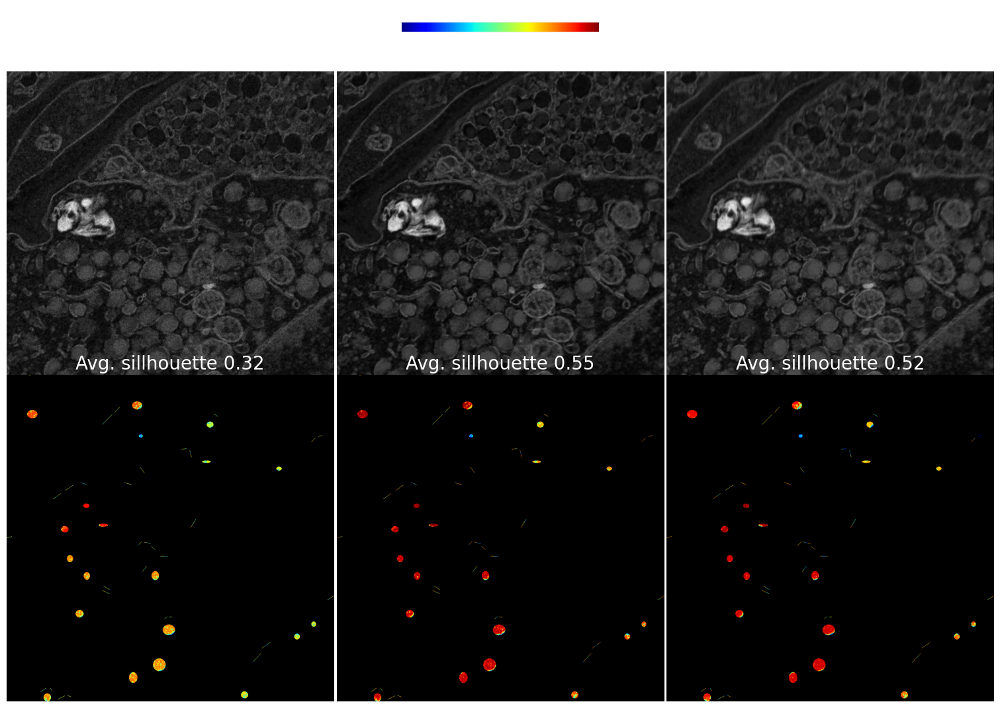

In [325]:
# modify jet so NaNs appear black
cmap = plt.cm.jet.copy()
cmap.set_bad(color='black')

bands=[24,24,24]
f, ax = plt.subplots(2,3,figsize=(15, 12))


ax[0][0].imshow(tiles_binned[0].FalseColor(bands))
ax[0][1].imshow(tiles_binned[1].FalseColor(bands))
ax[0][2].imshow(tiles_binned[2].FalseColor(bands))

ax[0][0].set_title(titles[0],fontsize=20)
ax[0][1].set_title(titles[1],fontsize=20)
ax[0][2].set_title(titles[2],fontsize=20)


im = ax[1][0].imshow(sil_img0,cmap=cmap,vmin=vmin,vmax=vmax)
ax[1][0].set_title("Avg. sillhouette %.2f" % np.nanmean(sil_img0),fontsize=20)

im = ax[1][1].imshow(sil_img1,cmap=cmap,vmin=vmin,vmax=vmax)
ax[1][1].set_title("Avg. sillhouette %.2f" % np.nanmean(sil_img1),fontsize=20)

im = ax[1][2].imshow(sil_img2,cmap=cmap,vmin=vmin,vmax=vmax)
ax[1][2].set_title("Avg. sillhouette %.2f" % np.nanmean(sil_img2),fontsize=20)



for i in range(2):
    for j in range(3):
        ax[i][j].axis('off')

# one shared colorbar

plt.tight_layout(pad=0.3)
plt.colorbar(im, ax=ax.ravel().tolist(), shrink=0.2,location='top')


make_dark_presentation(f,text_color='white', line_width=2.5, transparent=True)
plt.savefig("/Users/aj/Desktop/WIPfigures/sil_alignment_comparison_denoising.png", dpi=300, transparent=True)

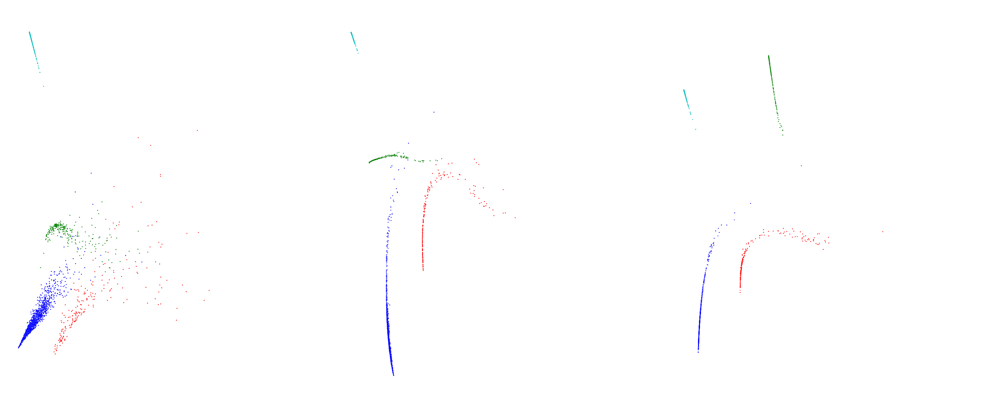

In [317]:
%matplotlib inline 

titles = ['20 frames aligned','20 frames aligned and denoised', '100 frames aligned']

f, ax = plt.subplots(1,3,figsize=(30,12))
sns.despine(left=True, bottom=True, right=True)


# colors
colors = ['w', 'r', 'g', 'b', 'c', 'm', 'y']
plt_colors = [colors[i] for i in masks.reshape((974**2))[sample_idx]]

# marker size
marker_size = []
for i in range(len(plt_colors)):
    if plt_colors[i] == 'w':  
        marker_size.append(0.0005)
    else:
        marker_size.append(1)

plt_idx = 0
for i in range(len(tiles_binned)):
    ax[i].set_facecolor((1,1,1)) 
    ax[i].scatter(all_embeddings[plt_idx][:,0],all_embeddings[plt_idx][:,1], s=marker_size,c=plt_colors) 
    ax[i].axis('off')
    ax[i].set_title(titles[plt_idx],fontsize=24)
    plt_idx+=1

plt.gca().set_aspect('equal')
f.tight_layout()
#plt.show()


make_dark_presentation(f,text_color='white', line_width=2.5, transparent=True)
plt.savefig("/Users/aj/Desktop/WIPfigures/umap_comparison.png", dpi=300, transparent=True)

### Silhouette comparison

In [ ]:
# compute sil scores for both
metric = 'euclidean'

sil_img0 = sil_scores(tiles_binned[0].EDX, masks, metric=metric)
sil_img1 = sil_scores(tiles_binned[1].EDX, masks, metric=metric)
sil_img2 = sil_scores(tiles_binned[2].EDX, masks, metric=metric)



# compute global vmin/vmax 
vmin = np.nanmin(np.array([sil_img0,sil_img1,sil_img2]))
vmax = np.nanmax(np.array([sil_img0,sil_img1,sil_img2]))

In [ ]:
cmap = plt.cm.jet.copy()
cmap.set_bad(color='black')

bands=[24,24,24]
zoom = (slice(250,450),slice(150,350),slice(None))

f, ax = plt.subplots(2,3,figsize=(15, 15))


ax[0][0].imshow(tiles_binned[0].FalseColor(bands)[zoom])
ax[0][1].imshow(tiles_binned[1].FalseColor(bands)[zoom])
ax[0][2].imshow(tiles_binned[2].FalseColor(bands)[zoom])
#ax[0][3].imshow(tiles_binned[3].FalseColor(bands))

ax[0][0].set_title(titles[0],fontsize=20)
ax[0][1].set_title(titles[1],fontsize=20)
ax[0][2].set_title(titles[2],fontsize=20)
#ax[0][3].set_title(titles[3],fontsize=20)

im = ax[1][0].imshow(sil_img0,cmap=cmap,vmin=vmin,vmax=vmax)
ax[1][0].set_title("Avg. sillhouette %.2f" % np.nanmean(sil_img0),fontsize=12)

im = ax[1][1].imshow(sil_img1,cmap=cmap,vmin=vmin,vmax=vmax)
ax[1][1].set_title("Avg. sillhouette %.2f" % np.nanmean(sil_img1),fontsize=12)

im = ax[1][2].imshow(sil_img2,cmap=cmap,vmin=vmin,vmax=vmax)
ax[1][2].set_title("Avg. sillhouette %.2f" % np.nanmean(sil_img2),fontsize=12)

#im = ax[1][3].imshow(sil_img3,cmap=cmap,vmin=vmin,vmax=vmax)
#ax[1][3].set_title("Avg. sillhouette %.2f" % np.nanmean(sil_img3),fontsize=12)

for i in range(2):
    for j in range(3):
        ax[i][j].axis('off')

# one shared colorbar

plt.tight_layout(pad=0.3)
plt.colorbar(im, ax=ax.ravel().tolist(), shrink=0.2,location='top')

### Unmixing 

In [281]:
endmembers.shape

(250, 6)

In [288]:
endmembers.shape

(250, 5)

In [311]:
X.T.shape

(250, 948676)

In [314]:
from pysptools.eea import FIPPI, NFINDR

# parallelization
cpu_count = psutil.cpu_count(logical=False)

# initialize abundance maps list
abundance_maps = []


for idx,tile_tmp in enumerate(tiles_binned):
    # extract the endmembers from the masks
    #nEM = 6
    #endmembers = np.empty((250,nEM),float)

    #for i in range(nEM):
    #    mask_idx = np.where(masks==i)
    #    #mask_idx = np.where(curr_mask)
    #    overlayed_spectrum = tile_tmp.EDX[mask_idx[0],mask_idx[1],:].mean(axis=0)
    #    endmembers[:,i] = overlayed_spectrum


    X = tile_tmp.EDX_2D 
    #em_model = NFINDR() #FIPPI()
    #endmembers = em_model.extract(X, q=6) 
    endmembers,_,_ = vca(X.T, 6)
    #endmembers = endmembers.T
    nEM = 6 #endmembers.shape[1]
    
    # unmix
    start = time.perf_counter()
    if __name__ == "__main__":
        with Pool(processes = cpu_count) as pool:
            unmixing = pool.starmap(nnls, zip(repeat(endmembers), tile_tmp.EDX_2D))

    abundance_maps.append(np.asarray([unmixing[i][0] for i in range(len(unmixing))]).reshape((tile_tmp.EDX_dim[0],tile_tmp.EDX_dim[1],nEM)))
    
    # time
    elapsed = time.perf_counter() - start
    print(f"Elapsed time for unmixing tile {idx:02d} is: {humanfriendly.format_timespan(elapsed):s}")


SNR estimated = nan[dB]
... Select the projective proj.
Elapsed time for unmixing tile 00 is: 3.83 seconds
SNR estimated = nan[dB]
... Select the projective proj.
Elapsed time for unmixing tile 01 is: 3.76 seconds
SNR estimated = 34.77749252319336[dB]
... Select the projective proj.
Elapsed time for unmixing tile 02 is: 3.96 seconds


### Show the abundance maps

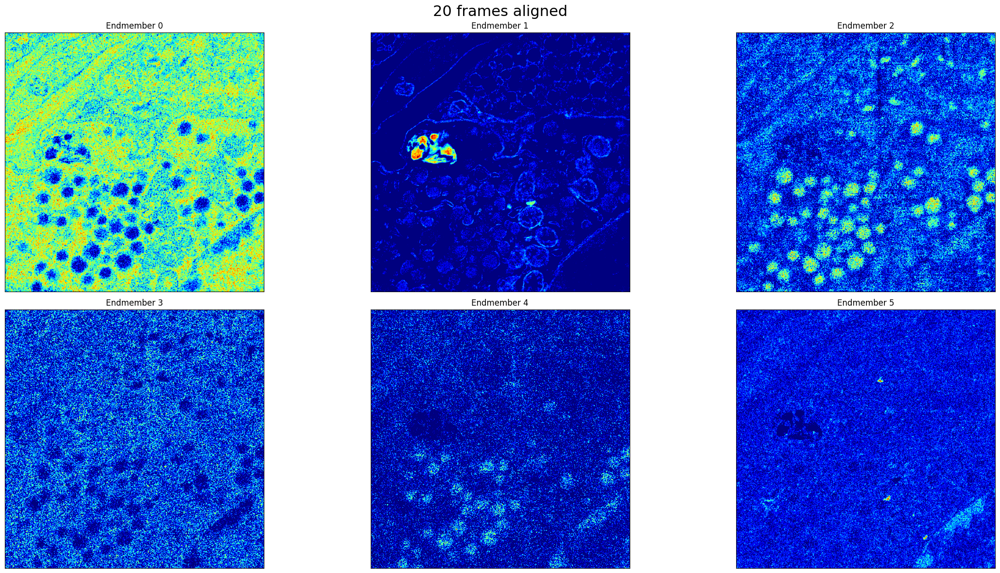

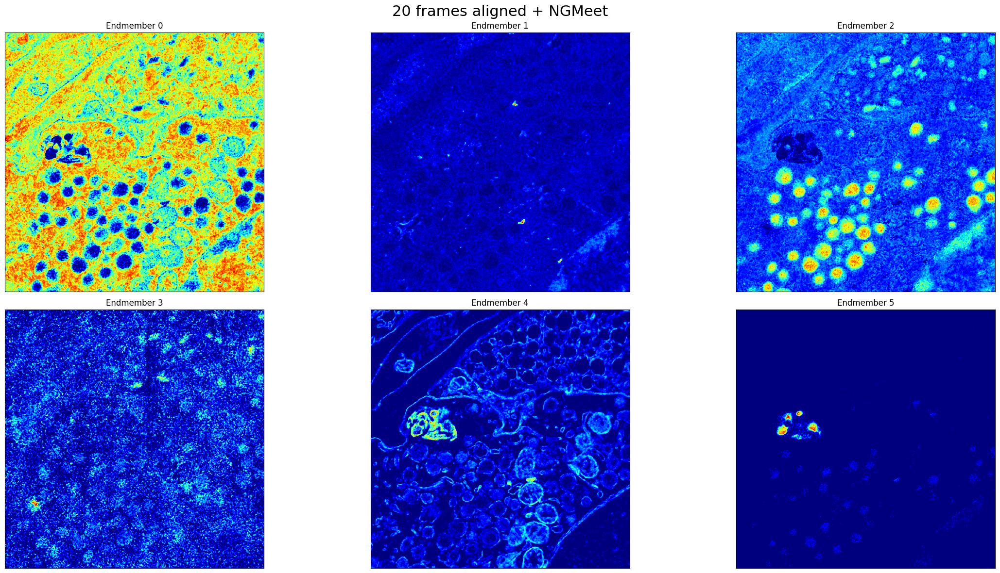

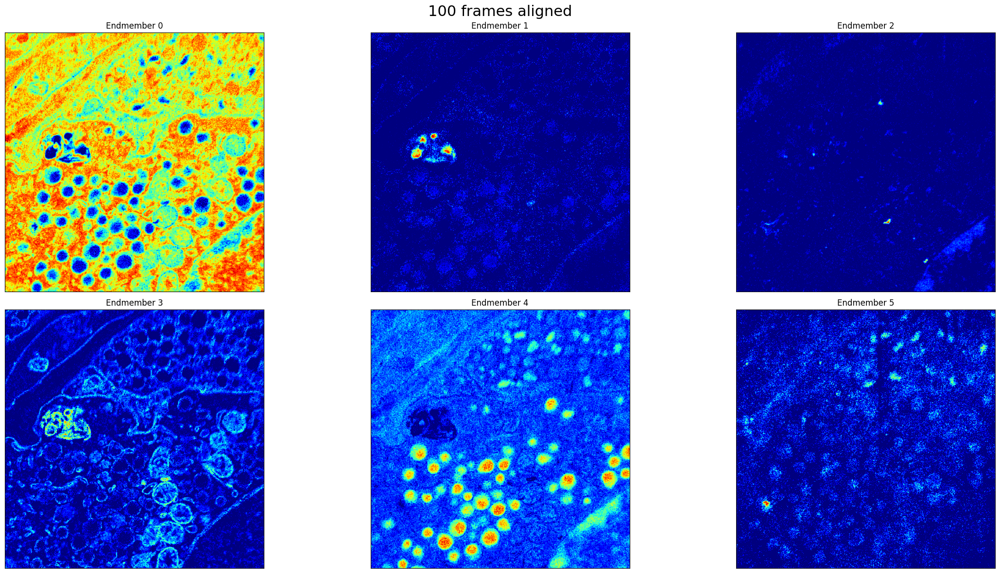

In [316]:
%matplotlib inline 
cmap = 'jet'

idx = 2
rows = 2
cols = 3




for idx in range(3):
    maps = abundance_maps[idx]
    tile_tmp = tiles_binned[idx]
    em_idx = 0
    fig, ax = plt.subplots(rows,cols,figsize=(24,12))
    
    for i in range(rows):
        for j in range(cols):
            try:
                ax[i][j].imshow(maps[:,:,em_idx], interpolation='nearest',cmap=cmap, vmin = 0)
            except:
                ax[i][j].imshow(np.zeros((tile_tmp.EDX_dim[0],tile_tmp.EDX_dim[0])), interpolation='nearest',cmap=cmap, vmin = 0)
                
            ax[i][j].set_title('Endmember ' + str(em_idx))
            ax[i][j].axes.get_xaxis().set_visible(False)
            ax[i][j].axes.get_yaxis().set_visible(False)
        
            em_idx+=1
     
    fig = plt.gcf()
    fig.suptitle(titles[idx], fontsize=22)
    fig.tight_layout()   
    plt.show()

